# Model building, start to finish: Traffic jams in ants: solution

[Data set download](https://s3.amazonaws.com/bebi103.caltech.edu/data/ant_traffic.txt)

<hr>

In collective behavior, individual interactors often look out only for their own immediate, short term interest within a crowd. This leads to issues like traffic jams on the road or in crowded pedestrian settings. In general, the flow (speed of moving objects times their density), often increases as density increases until hitting a critical point where the increased density gives rise to a traffic jam and flow begins to decrease. [Poissonnier et al.]( https://doi.org/10.7554/eLife.48945) were interested in how ants handle traffic. Unlike human pedestrians or drivers, ants may act more cooperatively in foraging to maximize food acquisition since they share a common goal of raising more young. Today, we will model traffic in ants and see whether they get into jams. 

In order to look at ant collective behavior at different densities, the authors starved ant colonies of varying sizes for a few days, and then provided them a foraging object (sugar!) via a bridge of varying width (B). The ants would climb across the bridge to get to the sugar and then return to colony. The variable colony size and bridge width lead to different densities of foraging ants on the bridge, which the authors took (170!) videos of. They measured density and flow across the bridge from the videos. They were interested in how different older models of traffic jams from human behaviors (A) might fit their data and how this might inform whether ants get into traffic while trying to forage.

![Ant traffic experiment](ant_Traffic_fig1.jpg)

As this is an eLife paper, the data is (supposed to be) publicly available. There was an issue with the Dryad repository for the data (the DOI link was broken), but the corresponding author very promptly sent me the data when I emailed her. You can download the data set [here](https://s3.amazonaws.com/bebi103.caltech.edu/data/ant_traffic.txt). We will begin with some exploration for the data before building some models!

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
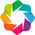

Loading BokehJS ...

In [1]:
# Colab setup ------------------
import os, sys, subprocess
if "google.colab" in sys.modules:
    cmd = "pip install --upgrade iqplot colorcet bebi103 arviz cmdstanpy watermark"
    process = subprocess.Popen(cmd.split(), stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    stdout, stderr = process.communicate()
    import cmdstanpy; cmdstanpy.install_cmdstan()
    data_path = "https://s3.amazonaws.com/bebi103.caltech.edu/data/"
else:
    data_path = "../data/"
# ------------------------------

import numpy as np
import pandas as pd

import bebi103

import bokeh
import bokeh.io
import bokeh.util.hex
import iqplot

import cmdstanpy
import arviz as az

import datashader
import holoviews as hv
import holoviews.operation.datashader

bebi103.hv.set_defaults()

bokeh.io.output_notebook()

We will read in the data and take a look at the format.

In [2]:
df = pd.read_csv(os.path.join(data_path, "ant_traffic.txt"), delimiter="\t")
df.head()

,D,F
0,0.5,0.5
1,0.5,0.0
2,0.5,0.0
3,0.5,0.0
4,0.5,0.0


Here, `'D'` represents ant density (in $\mathrm{ant}/\mathrm{cm}²$, based on the figure in the paper), ant `'F'` indicates flow, which is $\mathrm{ant}/\mathrm{cm}/\mathrm{s}$, also based on the figure. The authors generated a lot of data here (170 hour long videos sampled at 1 Hz ≈ 600,000 data points), so we might have a little trouble handling that much data with sampling. They use optimization to get their curve fits, which is a reasonable choice since they are data rich here. To speed things up for the sake of this exercise, I will thin the data stochastically. This shouldn't influence the modeling much, and I did some testing and found only quite small differences for the samples of the parameters after thinning the data. We will take a look at the thinned data as compared to the full set to do another sanity check that we aren't losing too much information. With this many data points, transparency doesn't always capture the distribution of data points, since it caps out at fully opaque, so I put a hexplot with a log colormap to get the idea for the data distribution.

In [3]:
df_thin = df.sample(n=10000, random_state=24601)

x, y, hex_size = df_thin["D"], df_thin["F"], 0.5

bins = bokeh.util.hex.hexbin(x, y, hex_size)

q = bokeh.plotting.figure(
    match_aspect=True,
    background_fill_color="#440154",
    frame_width=250,
    frame_height=250,
    x_axis_label="Density k (ant/cm²)",
    y_axis_label="Flow q (ant/cm/s)",
    title="Thinned data",
)
q.grid.visible = False

q.hex_tile(
    q="q",
    r="r",
    size=hex_size,
    line_color=None,
    source=bins,
    fill_color=bokeh.transform.log_cmap(
        "counts", "Viridis256", min(bins.counts), max(bins.counts)
    ),
)

color_bar = bokeh.models.ColorBar(
    color_mapper=bokeh.transform.log_cmap(
        "counts", "Viridis256", 0.0001, max(bins.counts)
    )["transform"],
    ticker=bokeh.models.LogTicker(),
    border_line_color=None,
    width=30,
    location=(0, 0),
    label_standoff=12,
)

q.add_layout(color_bar, "right")


x, y, hex_size = df["D"], df["F"], 0.5

bins = bokeh.util.hex.hexbin(x, y, hex_size)

r = bokeh.plotting.figure(
    match_aspect=True,
    background_fill_color="#440154",
    frame_width=250,
    frame_height=250,
    x_axis_label="Density k (ant/cm²)",
    y_axis_label="Flow q (ant/cm/s)",
    title="All data",
)
r.grid.visible = False

r.hex_tile(
    q="q",
    r="r",
    size=hex_size,
    line_color=None,
    source=bins,
    fill_color=bokeh.transform.log_cmap(
        "counts", "Viridis256", min(bins.counts), max(bins.counts)
    ),
)

color_bar = bokeh.models.ColorBar(
    color_mapper=bokeh.transform.log_cmap(
        "counts", "Viridis256", 0.0001, max(bins.counts)
    )["transform"],
    ticker=bokeh.models.LogTicker(),
    border_line_color=None,
    width=30,
    location=(0, 0),
    label_standoff=12,
)

r.add_layout(color_bar, "right")

bokeh.io.show(bokeh.layouts.gridplot([q, r], ncols=2))

Another approach to look at large data sets is to use datashader. Datashader tends to do a better job showing rare or low density points even when they are outnumbered by other values.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
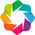

:DynamicMap   []
   :RGB   [D,F]   (R,G,B,A)

In [4]:
points = hv.Points(data=df, kdims=["D", "F"],)

hv.extension("bokeh")

# Datashade with spreading of points
hv.operation.datashader.dynspread(
    hv.operation.datashader.datashade(points, cmap=list(bokeh.palettes.Viridis10),)
).opts(
    frame_width=350,
    frame_height=300,
    padding=0.05,
    show_grid=False,
    bgcolor="white",
    xlabel="Density k (ant/cm²)",
    ylabel="Flow q (ant/cm/s)",
    title="All data",
)

The thinning looks pretty reasonable. Keep in mind that the colormap is on a log scale, so the amount of weight that the far densities will get to influence the posterior is almost negligible compared to the densities below ~8. The authors also do a fit on the average of the flow at each density in order to increase the weight of the points on the high density portion of the graph. We can also plot that here. We use the full data set to get the mean, and also plot the 2.5-97.5 percentiles for the data, calculated directly based on the full dataset. In addition, we make a plot to look at how many measurements the authors recorded at different ant densities.

In [5]:
df_lower, df_mean, df_upper, df_counts = (
    df.groupby("D").quantile(0.025).reset_index(),
    df.groupby("D").mean().reset_index(),
    df.groupby("D").quantile(0.975).reset_index(),
    df.groupby("D").count().reset_index(),
)

p = bokeh.plotting.figure(
    frame_width=300,
    frame_height=150,
    x_axis_label="Density k (ant/cm²)",
    y_axis_label="Mean flow q (ant/cm/s)",
    title="Mean flow at various ant densities",
)

for d, lb, ub in zip(df_lower["D"].values, df_lower["F"].values, df_upper["F"].values):
    p.line([d, d], [lb, ub], line_width=2)
p.circle("D", "F", source=df_mean, alpha=0.75, size=11)

q = bokeh.plotting.figure(
    frame_width=300,
    frame_height=150,
    x_axis_label="Density k (ant/cm²)",
    y_axis_label="Number of observations",
    y_axis_type="log",
    title="Number of observations of ants taking on a given density on the bridge",
)

q.circle("D", "F", source=df_counts, alpha=1, size=9)

bokeh.io.show(bokeh.layouts.gridplot([p, q], ncols=2))

It looks like the data is pretty linear in the early part of the regime, before the data becomes both much more sparse and may plateau. In order to try to get a model for ant traffic at these variable densities, the authors pulled several models from the literature. They start off with a parabolic shaped model (which makes sense for traffic, at some high density you start to get jammed up and are not able to increase flow, but instead it starts to reduce), an exponential, a modified parabola with an additional shape parameter $\alpha$, and their own two-phase flow, which describes the data as a piecewise linear relationship with a linearly increasing portion which goes to a flat line at some density. Here are the mathematical models:

Greenshields:$$q=k \cdot v_f \cdot \left( 1 - \frac{k}{k_j}\right) $$

Underwood:$$q=k \cdot v_f \cdot \mathrm{e}^{\frac{-k}{k_j}} $$

Pipes-Munjal:$$q=k \cdot v_f \cdot \left( 1 - \left(\frac{k}{k_j}\right)^\alpha\right) $$

Two-phase flow:

\begin{align}
q(k) = \left\{
\begin{array}{lr}
k \cdot v &\mathrm{if} \, k \leq k_j\\
k_j \cdot v &\mathrm{if} \, k > k_j
\end{array}
\right.
\end{align} 

For these equations, $q$ is the flow, $k$ is the density, $k_j$ is the sort of threshold after which either jamming or plateauing of flow increase occurs, $v_f$ is the free speed of interactors without contact, $\alpha$ defines how fast the flow decays after threshold. With these in hand, we can begin to define a statistical model for our data generating process. This is where you come in! The best way to get comfortable modeling is to do it. Pick one or multiple mathematical models from above and construct a statistical model from it. Code that up in Stan and get samples! For your model, then fit the thinned data set and the averaged data set and make some comparisons of the results. For the sake of time, I have included code from Justin to plot the results once you write down your model and code it in Stan.


To decide on priors for some of these quantities, it may be usefult to take a look at what a set of ants looks like when sitting on a 20mm bridge, or to look up the size of an Argentine ant, *Linepithema humile*, the all too common invasive ant all over LA. Here are ants on a 20mm wide bridge:

![Ants on a 20mm bridge](ants_on_bridge.PNG)

This image was taken from a video of the experiment used to generate the density data we are analyzing today, which can be [found here](https://doi.org/10.7554/eLife.48945.012).

## Model implementation

Statistical model for Greenshields:

\begin{align}
&k_j \sim \text{Norm}(50, 10),\\[1em]
&v_f \sim \text{Gamma}(3, 2),\\[1em]
&\sigma \sim \text{HalfNorm}(0,1.0),\\[1em]
&k_i \sim \text{Norm}(\text{greensheilds}(k_i, v_f, k_j), \sigma)\; \forall i.
\end{align}


In [6]:
sm_prior_pred = cmdstanpy.CmdStanModel(
    stan_file="ant_traffic_prior_predictive.stan"
)

INFO:cmdstanpy:compiling stan file /Users/bois/Dropbox/git/bebi103_course/2022/b/content/recitations/05/ant_traffic_prior_predictive.stan to exe file /Users/bois/Dropbox/git/bebi103_course/2022/b/content/recitations/05/ant_traffic_prior_predictive
INFO:cmdstanpy:compiled model executable: /Users/bois/Dropbox/git/bebi103_course/2022/b/content/recitations/05/ant_traffic_prior_predictive


With the code ready for the prior predictive checks, you are ready to sample!

In [7]:
k = df_thin['D'].values

k = np.linspace(0, k.max(), 2000)

data = {
    "N": len(k),
    "k": k,
    "k_j_mu": 50.0,
    "k_j_sigma": 10.0,
    "v_f_alpha": 3.0,
    "v_f_beta": 2.0,
    "sigma_mu": 0.0,
    "sigma_sigma": 1.0,
    "alpha_alpha":3.0,
    "alpha_beta":2.0
}

samples = sm_prior_pred.sample(data=data, iter_sampling=1000, fixed_param=True)

INFO:cmdstanpy:CmdStan start procesing


chain 1 |          | 00:00 Status

INFO:cmdstanpy:CmdStan done processing.


Now we parse the data for our plots.

In [8]:
samples_greensheilds = az.from_cmdstanpy(
    posterior=samples, prior=samples, prior_predictive=["q_greensheilds"]
)
samples_underwood = az.from_cmdstanpy(
    posterior=samples, prior=samples, prior_predictive=["q_underwood"]
)
samples_pipesmunjal = az.from_cmdstanpy(
    posterior=samples, prior=samples, prior_predictive=["q_pipesmunjal"]
)
samples_twophase = az.from_cmdstanpy(
    posterior=samples, prior=samples, prior_predictive=["q_twophase"]
)

We will use a predictive regression here to get a sense of how we did.

In [9]:
bokeh.io.show(
    bokeh.layouts.gridplot([
    bebi103.viz.predictive_regression(
        samples_greensheilds.prior_predictive['q_greensheilds'],
        samples_x=k,
        percentiles=[30, 60, 90, 99],
        x_axis_label='density',
        y_axis_label='flow rate',
        title='greensheilds'
    ),
        bebi103.viz.predictive_regression(
        samples_underwood.prior_predictive['q_underwood'],
        samples_x=k,
        percentiles=[30, 60, 90, 99],
        x_axis_label='density',
        y_axis_label='flow rate',
        title='underwood'
    ),
       bebi103.viz.predictive_regression(
        samples_pipesmunjal.prior_predictive['q_pipesmunjal'],
        samples_x=k,
        percentiles=[30, 60, 90, 99],
        x_axis_label='density',
        y_axis_label='flow rate',
        title='pipesmunjal'
    ),
        bebi103.viz.predictive_regression(
        samples_twophase.prior_predictive['q_twophase'],
        samples_x=k,
        percentiles=[30, 60, 90, 99],
        x_axis_label='density',
        y_axis_label='flow rate',
        title='twophase'
    )
    ], ncols = 2
    )
)

These plots look pretty good! There are some cases where the flow rate goes negative, particularly at low values. This indicates it would probably be a good idea to model $\sigma$ about our mathematical distribution differently (maybe as a function of the density?) but we will continue with an assumption of homoscedasticity for now. The nice thing about building models from scratch like this is that we can add additional layers of complexity if we are not happy with model performance. We are ready for sampling! Using the building blocks that we coded for the prior predictive, we can code up our model in Stan, prepare a dictionary with the data, and draw samples. 

In [10]:
k = df_thin['D'].values
q = df_thin['F'].values

#k = df_mean['D'].values
#q = df_mean['F'].values

N_ppc = 200
k_ppc = np.linspace(0, k.max(), N_ppc)
data = {
    "N": len(k),
    "k": k,
    "q": q,
    "N_ppc": N_ppc,
    "k_ppc": k_ppc,
}

This format of the data will work to feed into all our models. The real work now is to code these up in Stan! I will just include one example of the Stan code here, as the only difference between the models is to call a different function for the mathematical model (all functions are here). For the Pipes-Munjal model, you would have to uncomment the lines declaring the parameter $\alpha$ and it's prior. 

```stan
functions {
  real greensheilds(real k_i, real k_j, real v_f) {
    real q = k_i*v_f*(1- (k_i/k_j) );
    return q;
  }
  
  real underwood(real k_i, real k_j, real v_f) {
    real q = k_i*v_f*2.7182818285^(-k_i/k_j);
    return q;
    }
  
  real twophase(real k_i, real k_j, real v_f) {
    if (k_i <= k_j) {
      return k_i*v_f;
    } else {
      return k_j*v_f;
    }
  }
  
  real pipesmunjal(real k_i, real k_j, real v_f, real alpha) {
    real q = k_i*v_f*(1- (k_i/k_j)^alpha);
    return q;
  }
}

data {
  int<lower=1> N;
  int N_ppc;
  real k[N];
  real q[N];
  real k_ppc[N_ppc];
  
}

parameters {
  real<lower=0> k_j;
  real<lower=0> v_f;
  real<lower=0> sigma;
  //real<lower=0> alpha;
}

transformed parameters {
  real mu[N];

  for (i in 1:N) {
    mu[i] = greensheilds(k[i], k_j, v_f);
  }
}

model {
  k_j ~ normal(50.0, 10.0);
  v_f ~ gamma(3.0, 2.0);
  sigma ~ normal(0.0, 1.0);
  //alpha ~ gamma(3.0, 2.0);

  q ~ normal(mu, sigma);
}


generated quantities {
  real q_ppc[N_ppc];

for (i in 1:N_ppc) {
    real mu_ppc = greensheilds(k_ppc[i], k_j, v_f);
    q_ppc[i] = normal_rng(mu_ppc, sigma);
  }
}

```

Let's sample!

In [11]:
sm = cmdstanpy.CmdStanModel(stan_file="ant_traffic_model_greensheilds.stan")

samples = sm.sample(data=data, iter_sampling=1000, chains=4)

samples = az.from_cmdstanpy(posterior=samples, posterior_predictive=["q_ppc"])

INFO:cmdstanpy:compiling stan file /Users/bois/Dropbox/git/bebi103_course/2022/b/content/recitations/05/ant_traffic_model_greensheilds.stan to exe file /Users/bois/Dropbox/git/bebi103_course/2022/b/content/recitations/05/ant_traffic_model_greensheilds
INFO:cmdstanpy:compiled model executable: /Users/bois/Dropbox/git/bebi103_course/2022/b/content/recitations/05/ant_traffic_model_greensheilds
INFO:cmdstanpy:CmdStan start procesing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

INFO:cmdstanpy:CmdStan done processing.


For this model, we can now visualize the posterior with a corner plot!

In [12]:
bokeh.io.show(
    bebi103.viz.corner(
        samples, parameters=["k_j", "v_f", "sigma"], xtick_label_orientation=np.pi / 4
    )
)

No divergences, so that's good. Before I comment on the results, let's take a look at the posterior predictive check data. We will display the plot as a PNG since there are so many data points to avoid choking the browser.

In [13]:
q_ppc = samples.posterior_predictive['q_ppc'].stack(
    {"sample": ("chain", "draw")}
).transpose("sample", "q_ppc_dim_0")

p = bebi103.viz.predictive_regression(
    q_ppc,
    samples_x=k_ppc,
    percentiles=[30, 50, 70, 99],
    data=np.vstack((k, q)).transpose(),
    x_axis_label='ant density, k [ant/cm²]',
    y_axis_label='ant flow, q [ant/cm/s]',
    x_range=[0, k.max()],
)

bokeh.io.export_png(p, filename="ppc_1.png");

![First posterior predictive check](ppc_1.png)

To be on the safe side, we should also take a look at the parallel coordinate plot. 

In [14]:
bokeh.io.show(
    bebi103.viz.parcoord(
        samples,
        transformation="minmax",
        parameters=["k_j", "v_f", "sigma"],
    )
)

Looks good! Nothing looks out of the ordinary here. Now for some commentary on this model. Here, we are looking at the Greensheilds model. For one, it seems like a very simplistic model for this data: an uside down U shape (parabola). The data doesn't really capture the downward part of the function, and doesn't very convincingly enter the parabola peak regime either. This leads to a shape the is slightly curved, but mostly linear in the region with lots of data. Since almost all the data points fall in the regime of low-medium density, the full dataset pushes the model to prioritize fit in that regime. As a generative model this seems like a pretty pathological failure. Also, note that the parameter estimate is exceedingly high indeed for $k_f$. This variable represents the peak of the parabola, where increased density begins to lead to a traffic jam, and hence reduced flow overall. Thinking about the number given here, around 95 ants per square centimeter, this is evidently problematic. The ants used in this study are large enough that They would probably have to start stacking on top of each other to reach density, which would certainly change the paradigm. The largest densities seen experimentally were ~18 ants per square centimeter. Take a look at what these high ant densities looked like on the bridge: [here](https://doi.org/10.7554/eLife.48945.013). Based on the video, a 4-5 times increase in the number of ants seems improbable. Also note that this puts the parameter estimate at ≈5 standard deviations away from the prior mean that we set. Even with 10,000 data points, this will influence the parameter, maybe dramatically. Looking at the curve fits from the paper, they place the $k_j$ value for this parameter at ~$200$. This is an order of magnitude higher than any measured density! This is a case where the choice of prior actually hugely influenced the inference. In this case, it is largely because the model fairly catastrophically fails to explain the data. Thinking about the parameter estimates, though, in the case of this model (as bad as it is) the prior effecting the outcome strikes me as a philosophically good thing in this case: we know that the jamming density of the ants can't be extremely high simply given physical constraints of how many can pack into a given area. Also, video from above would be difficult to use to parse a situation where the ant density was also given by ants stacked on top of each other. If this model is an accurate representation of the generative process for the data, the data we have does not provide enough information to resolve this parameter. 

We will now take a look at what happens if we fit the averaged data with the same model. 

In [15]:
k = df_mean["D"].values
q = df_mean["F"].values

N_ppc = 200
k_ppc = np.linspace(0, k.max(), N_ppc)
data = {
    "N": len(k),
    "k": k,
    "q": q,
    "N_ppc": N_ppc,
    "k_ppc": k_ppc,
}

sm = cmdstanpy.CmdStanModel(stan_file="ant_traffic_model_greensheilds.stan")

samples = sm.sample(data=data, iter_sampling=1000, chains=4)

samples = az.from_cmdstanpy(posterior=samples, posterior_predictive=["q_ppc"])

bokeh.io.show(
    bebi103.viz.corner(
        samples, parameters=["k_j", "v_f", "sigma"], xtick_label_orientation=np.pi / 4
    )
)

INFO:cmdstanpy:found newer exe file, not recompiling
INFO:cmdstanpy:CmdStan start procesing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

INFO:cmdstanpy:CmdStan done processing.


These parameter estimates look totally different! $v_f$ is pretty similar, which is a good sign, and makes sense for an ant: ~ 1-2 cm per second as max speed. This is also consistent with the value reported from a different experiment for speed of an ant alone on a bridge. Good on that front! For $k_j$, the value given here is very different. Using the averaging approach much more heavily weighs the large data points, which results in model seeming to resolve this parameter, i.e. it indicates that we have sufficient information to see the jam density for the ants. However, the model then rather badly overshoots the early parts of the data, and undershoots in the center of the graph. The issue here is that the weighting leads to a model that explains much less of the data, though captures the upper points better (see posterior predictive below). This is a potential bias for the fit. However, this model is evidently a pretty bad one for this data, so much of the pathology is due to that mismatch. 

In [16]:
q_ppc = samples.posterior_predictive['q_ppc'].stack(
    {"sample": ("chain", "draw")}
).transpose("sample", "q_ppc_dim_0")

p = bebi103.viz.predictive_regression(
    q_ppc,
    samples_x=k_ppc,
    percentiles=[30, 50, 70, 99],
    data=np.vstack((k, q)).transpose(),
    y_axis_label='ant flow, q [ant/cm/s]',
    x_range=[0, k.max()],
)

bokeh.io.export_png(p, filename="ppc_2.png");

![Second posterior predictive check](ppc_2.png)

Building the other models will also give an idea of what is going on with the data, and what underlying generative process is at play. Soon, we will go into model selection, which will give a principled way of calling which model performs best to capture our data with the fewest needed parameters. 

In [17]:
bebi103.stan.clean_cmdstan()

## Computing environment

In [18]:
%load_ext watermark
%watermark -v -p numpy,pandas,cmdstanpy,arviz,bokeh,bebi103,iqplot,jupyterlab,datashader
bebi103.stan.clean_cmdstan()

Python implementation: CPython
Python version       : 3.9.7
IPython version      : 7.29.0

numpy     : 1.20.3
pandas    : 1.3.5
cmdstanpy : 1.0.0
arviz     : 0.11.4
bokeh     : 2.3.3
bebi103   : 0.1.10
iqplot    : 0.2.4
jupyterlab: 3.2.1
datashader: 0.13.0

